# <i> Data Reduction - Analysis of RV Uma Blue </i>

## <u> Imports </u>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from pathlib import Path
import shutil
import astropy
from astropy.io import fits
from astropy import units as u
from astropy.stats import mad_std
from astropy.time import Time
import ccdproc as ccdp
from ccdproc import ImageFileCollection
from ccdproc import Combiner
from photutils.detection import DAOStarFinder
from photutils.aperture import CircularAnnulus, CircularAperture
from photutils.aperture import ApertureStats
import astroalign as aa
from astroquery.simbad import Simbad
customSimbad = Simbad()
customSimbad.add_votable_fields('flux(R)','flux(G)','flux(B)', 'flux(V)' 'ra(deg)','dec(deg)')
import warnings
warnings.filterwarnings("ignore")

In [2]:
broad_filepath = ".\Year 2 Lab\\2023_1_23\\RV Uma"

uma_2022_03_20_collection = ImageFileCollection( Path(broad_filepath + "\\2022_03_20\\Blue") )
uma_2022_03_22_collection = ImageFileCollection( Path(broad_filepath + "\\2022_03_22\\Blue") )
uma_2022_03_24_collection = ImageFileCollection( Path(broad_filepath + "\\2022_03_24\\Blue") )
uma_2023_02_23_collection = ImageFileCollection( Path(broad_filepath + "\\2023_02_23\\RV Uma\\Blue") )
uma_2023_04_03_collection = ImageFileCollection( Path(broad_filepath + "\\2023_04_03\\RV_Uma\\Blue") )
tyc_2023_04_03_collection = ImageFileCollection( Path(broad_filepath + "\\2023_04_03\\tyc_3023-1974-1\\Blue") )

uma_lights = ( uma_2022_03_20_collection.files_filtered(include_path=True)
                       + uma_2022_03_22_collection.files_filtered(include_path=True) 
                       + uma_2022_03_24_collection.files_filtered(include_path=True)
                       + uma_2023_02_23_collection.files_filtered(include_path=True)
                       + uma_2023_04_03_collection.files_filtered(include_path=True) )

tyc_lights = tyc_2023_04_03_collection.files_filtered(include_path=True)

`uma_lights` and `tyc_lights` are lists of filepaths.

## <u> Plotting a single Gaussian function </u>

The earliest image taken is `Reduced_RV_Uma_Light_Luminance_16_secs_001.fits` from the `uma_luminance_2022_03_20_collection`. I will use this reduced FITS file for all the single image graphs.

In [3]:
uma_lights[0]

'Year 2 Lab\\2023_1_23\\RV Uma\\2022_03_20\\Blue\\Reduced_RV_Uma_Light_Blue_32_secs_001.fits'

In [4]:
data = fits.getdata(uma_lights[0])

The below image is plotted on a log scale to to make all the different sources more visible.

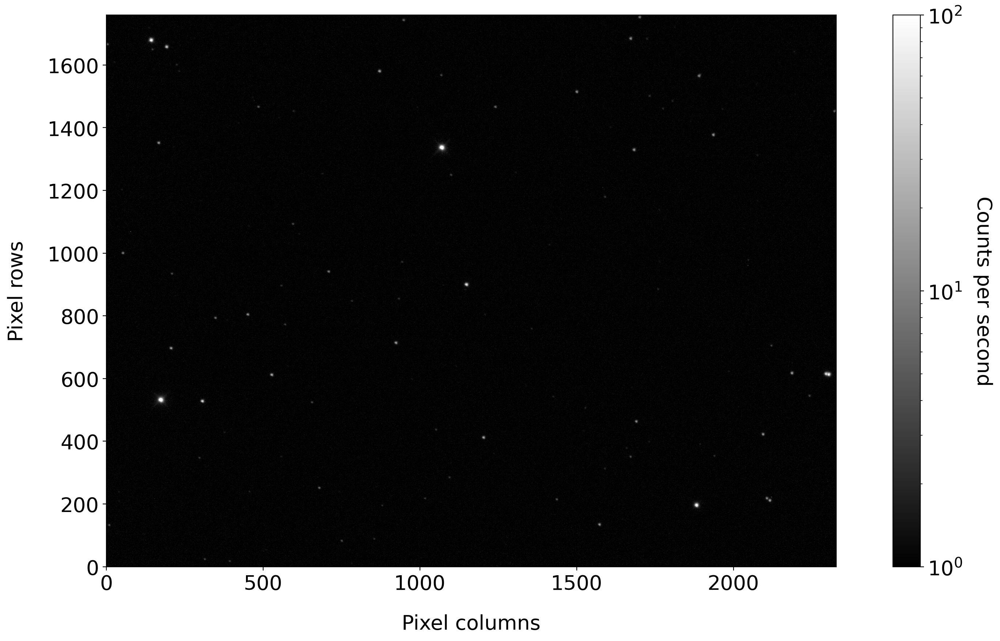

In [5]:
plt.figure(figsize=(20,10), dpi = 200)
plt.imshow(data, cmap='gray', norm = colors.LogNorm(vmin = 1, vmax = 100))
plt.xlabel('Pixel columns', fontsize=20, labelpad = 20)
plt.ylabel('Pixel rows', fontsize=20, labelpad = 20)
plt.xticks(size = 20)
plt.gca().invert_yaxis()
plt.yticks(size = 20)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Counts per second', fontsize = 20, rotation = 270, labelpad=30)

In [6]:
data.shape

(1760, 2328)

### Zoom in on RV Uma

In [7]:
pixel_range = 30
xmin, xmax = 1146 - pixel_range, 1146 + pixel_range
ymin, ymax = 900 - pixel_range, 900 + pixel_range

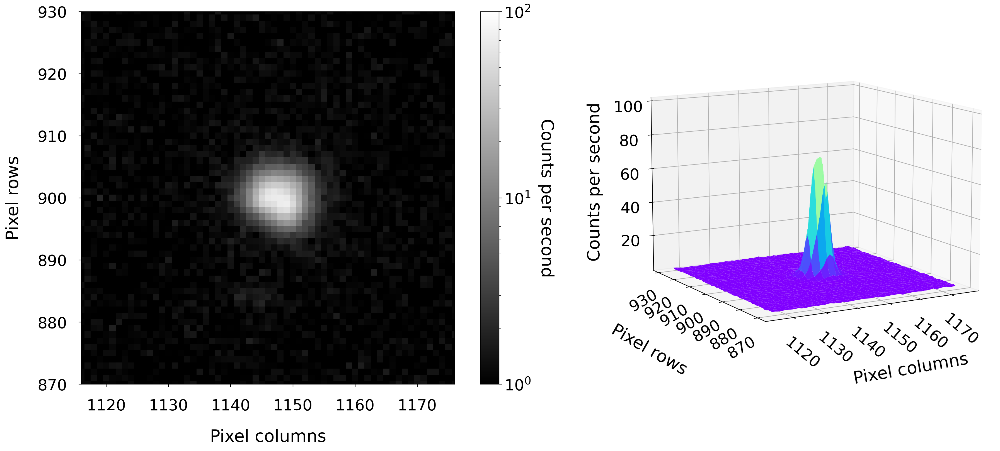

In [8]:
plt.figure(figsize=(20,8), dpi = 200)

ax = plt.subplot(1,2,1)
plt.imshow(data, cmap='gray', norm = colors.LogNorm(vmin = 1, vmax = 100))
ax.tick_params(labelsize = 20, pad = 15)
plt.xlabel('Pixel columns', fontsize=22, labelpad = 20)
plt.ylabel('Pixel rows', fontsize=22, labelpad = 20)
plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Counts per second', fontsize = 22, rotation = 270, labelpad=30)

ax = plt.subplot(1,2,2, projection = '3d')
x = np.arange(xmin, xmax)
y = np.arange(ymin, ymax)
X, Y = np.meshgrid(x, y)
surf = ax.plot_surface(X, Y, data[int(ymin):int(ymax), int(xmin):int(xmax)], cmap = 'rainbow', edgecolor ='none', 
                                                                                           vmin = 1, vmax = 100) 
ax.tick_params(labelsize = 20, pad = 10)
ax.view_init(11, 240)
ax.xaxis.set_rotate_label(False) 
ax.yaxis.set_rotate_label(False) 
ax.zaxis.set_rotate_label(False) 
ax.set_xlabel('Pixel columns', fontsize=22, rotation=10, labelpad = 45)
ax.set_ylabel('Pixel rows', fontsize=22, rotation=330, labelpad = 45)
ax.set_zlabel('Counts per second', fontsize=22, rotation=90, labelpad = 25)
plt.xticks(rotation=320)
plt.yticks(rotation=30)
ax.set_zlim3d(1,100)

plt.tight_layout(w_pad = 1)

#plt.savefig("pixel counts 3D graph.png", transparent = False, facecolor = 'white')

## <u> Finding stars within an image </u>

I will use `DAOStarFinder` to return a list of sources and their central co-ordinates.

To set up `DAOStarFinder`, we were told to use:
* A threshold frequency of 5+ * the standard deviation
* A full width half maximum (FWHM) of 6 arcseconds for RZ Cep
* A circular aperture of radius about 3.5 * FWHM

I'm not sure if the full width half maximum also applies to RV Uma, so I will find an estimate for it. I will do this by plotting a 2D gaussian across the one row with the peak value in the image.

### Estimate RV Uma's full width half maximum

In [9]:
maximums = []
for i in range(895, 905):
    maximums.append(max(data[i, int(xmin):int(xmax)]))

maximum = max(maximums)
for row in maximums:
    if row == maximum:
        peak_row = 895 + maximums.index(row)

print(f"The row with the peak value is row: {peak_row}, value: {maximum:0.1f} counts per second")

FWHM_y = max(data[peak_row, int(xmin):int(xmax)]) / 2
print(f"The number of counts per sec at the FWHM is: {FWHM_y:0.1f}")

The row with the peak value is row: 899, value: 72.6 counts per second
The number of counts per sec at the FWHM is: 36.3


(-3.0, 100.0)

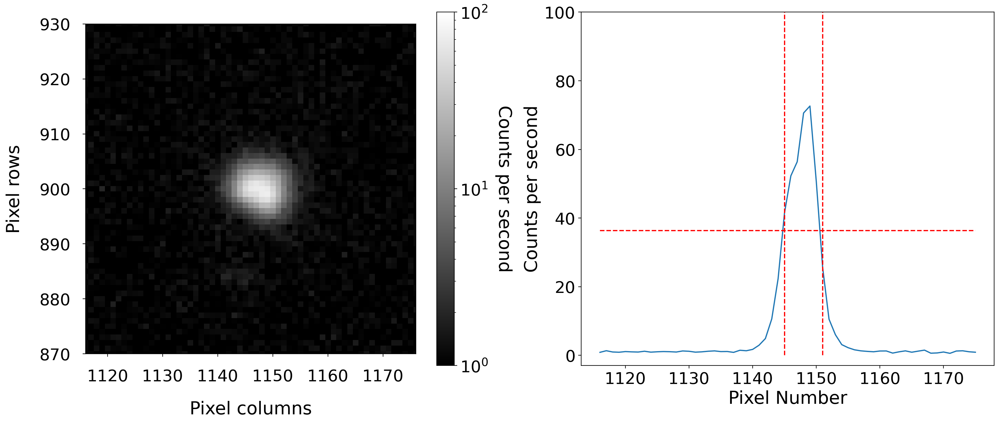

In [10]:
plt.figure(figsize=(20,8), dpi = 200)

ax = plt.subplot(1,2,1)
plt.imshow(data, cmap='gray', norm = colors.LogNorm(vmin = 1, vmax = 100))
ax.tick_params(labelsize = 20, pad = 15)
plt.xlabel('Pixel columns', fontsize=22, labelpad = 20)
plt.ylabel('Pixel rows', fontsize=22, labelpad = 20)
plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Counts per second', fontsize = 22, rotation = 270, labelpad=30)

x, y = np.arange(xmin, xmax), np.linspace(0, 200, 60)
fwhm_line = np.linspace(FWHM_y, FWHM_y, pixel_range*2)
FWHM_xmin, FWHM_xmax = 1145, 1151
fwhm_min, fwhm_max = np.linspace(FWHM_xmin, FWHM_xmin, pixel_range*2), np.linspace(FWHM_xmax, FWHM_xmax, pixel_range*2)

plt.subplot(1,2,2)
plt.plot(x, data[899, int(xmin):int(xmax)])
plt.plot(x, fwhm_line, c = 'red', ls = '--')
plt.plot(fwhm_min, y, c = 'red', ls = '--')
plt.plot(fwhm_max, y, c = 'red', ls = '--')
plt.xlabel('Pixel Number', fontsize = 22)
plt.ylabel('Counts per second', fontsize = 22)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(-3, 100)

#plt.savefig("pixel counts graph.png", transparent = False, facecolor = 'white')

The closest match I can get is between columns 1145 to 1151, so the FWHM appears to be about 6 pixels wide.

In [11]:
scale = fits.getval(uma_lights[0], 'SCALE')
print(f"The number of arcseconds per pixel is: {scale}")

The number of arcseconds per pixel is: 0.979925


Therefore:

In [12]:
FWHM = 6 / scale
print(f"The FWHM is: {FWHM:0.2f} arcseconds")

The FWHM is: 6.12 arcseconds


Welp, guess I didn't need to bother with that :')

### Identify the sources

I'm just going to do this with one images as a tester first, and then I will write out a loop.

In [13]:
thresh = 5.
radius = 3.5 * FWHM

I don't need to have too many stars in the table, just enough to make sure RV Uma is in it. It's not the brightest star in the image so I cannot assume it will always be at the top.

In [14]:
daofind = DAOStarFinder(fwhm=FWHM, threshold=thresh*np.median(data), brightest = 15, exclude_border=True)
sources = daofind(data - np.median(data))  
for col in sources.colnames:  
    sources[col].info.format = '%.8g'  # for consistent table output
sources

id,xcentroid,ycentroid,sharpness,roundness1,roundness2,npix,sky,peak,flux,mag
int32,float64,float64,float64,float32,float64,int32,float64,float64,float64,float64
1,173.098,531.93169,0.2297963,-0.30287659,-0.47838258,49,0,529.93225,158.49088,-5.5000107
2,1069.17,1336.527,0.3033415,-0.53148037,-0.25873335,49,0,492.80527,136.03285,-5.3341095
3,1881.1533,195.88802,0.48295003,-0.19101173,0.04115196,49,0,302.82285,92.281616,-4.912788
4,142.81892,1678.9187,0.4375281,-0.19681944,-0.32305646,49,0,176.05602,52.964973,-4.3099719
5,2302.3548,612.93665,0.45033146,-0.13729644,-0.029060592,49,0,122.49883,36.21505,-3.8972227
6,1147.7059,899.7836,0.37704005,-0.49947914,-0.38546096,49,0,69.70079,21.295067,-3.3206975
7,2294.0119,614.72738,0.39485861,0.011678961,-1.6507854e-05,49,0,66.966766,20.633102,-3.2864113
8,305.9235,527.84673,0.49624326,-0.35654786,-0.36163856,49,0,64.310616,19.416363,-3.2204197
9,192.07483,1657.6819,0.42613966,-0.23884776,-0.2591953,49,0,41.036373,12.247505,-2.7201191


### Create a Circular Arpeture around each source

In [15]:
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
apertures = CircularAperture(positions, r=radius)

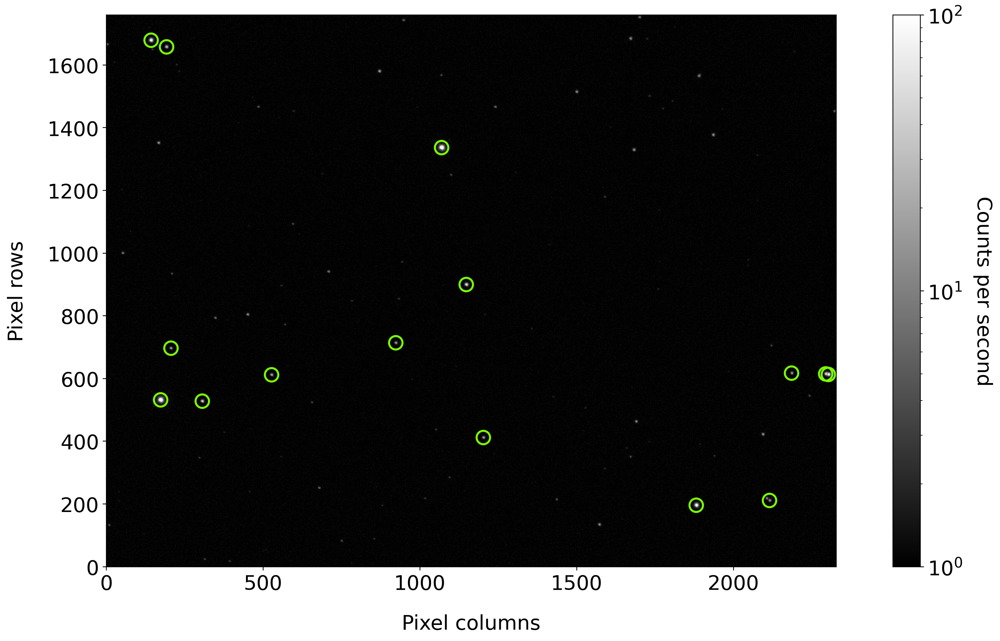

In [16]:
plt.figure(figsize=(20,10), dpi = 200)
plt.imshow(data, cmap='gray', norm = colors.LogNorm(vmin = 1, vmax = 100))
cbar = plt.colorbar()
apertures.plot(color='lawngreen', lw=2, ls = '-')
plt.xlabel('Pixel columns', fontsize=20, labelpad = 20)
plt.ylabel('Pixel rows', fontsize=20, labelpad = 20)
plt.xticks(size = 20)
plt.gca().invert_yaxis()
plt.yticks(size = 20)
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Counts per second', fontsize = 20, rotation = 270, labelpad=30)

### Calculate the total number of star counts within the apeture

I will do this using `ApertureStats`.

In [17]:
#set up the aperture photometry.
CIRC_stats = ApertureStats(data, apertures)

In [18]:
df_star_stats = pd.DataFrame(positions,columns=['xcenters','ycenters'])
df_star_stats['id'] = np.transpose(sources['id'])
#find the total count (sum) within the circular apertures
df_star_stats['Sum in circular aperture'] = CIRC_stats.sum
#find the total area of the circular apertures
df_star_stats['Area of circular aperture'] = CIRC_stats.sum_aper_area.value  
df_star_stats.head()

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture
0,173.098004,531.931694,1,26558.112565,1442.788882
1,1069.169958,1336.527017,2,26200.808300,1442.788882
2,1881.153256,195.888023,3,9263.658349,1442.788882
3,142.818923,1678.918702,4,6911.773930,1442.788882
4,2302.354800,612.936648,5,7299.998129,1442.788882


It is a good idea to subtract the sky background read noise everywhere outside of a certain radius away from the star. To do this, you create a Circular Annulus around each Circular Aperture and calculate the mean background inside it. 

We were told to set the inner radius to 3.5 * FWHM and the outer radius to 3.5 * FWHM * $\sqrt5$

In [19]:
annulus_aperture = CircularAnnulus(positions, r_in=radius, r_out=radius*np.sqrt(5))

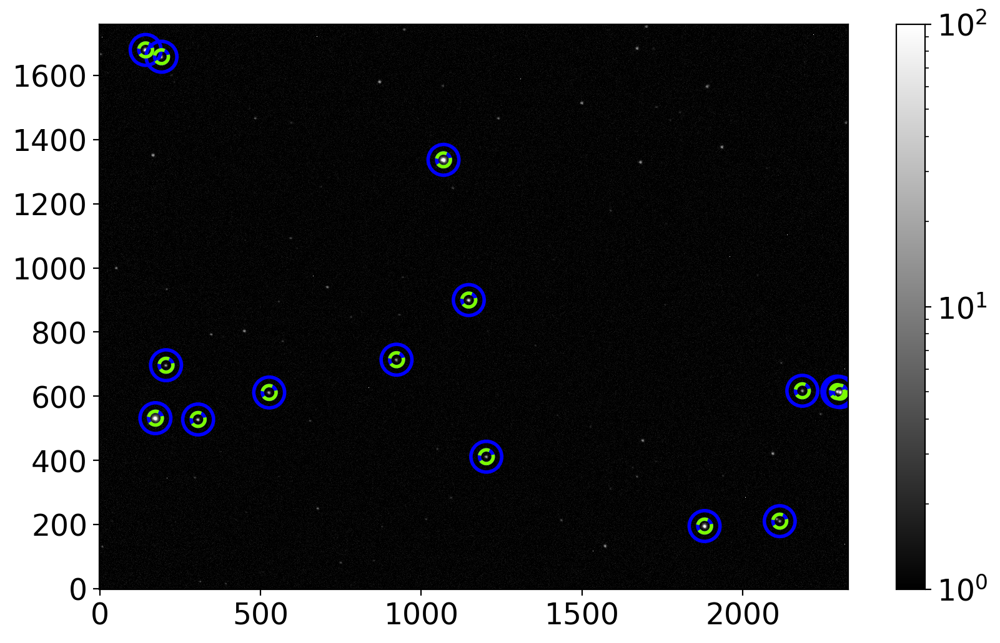

In [20]:
plt.figure(figsize=(10,6), dpi = 200)
plt.imshow(data, cmap='gray', origin='lower', interpolation='nearest', norm = colors.LogNorm(vmin = 1, vmax = 100))
annulus_aperture.plot(color='blue', lw=2)
apertures.plot(color='lawngreen', lw=2, ls = '--')
plt.xticks(size = 17)
plt.yticks(size = 17)
plt.colorbar().ax.tick_params(labelsize=17)

Zoomed in, it looks like this:

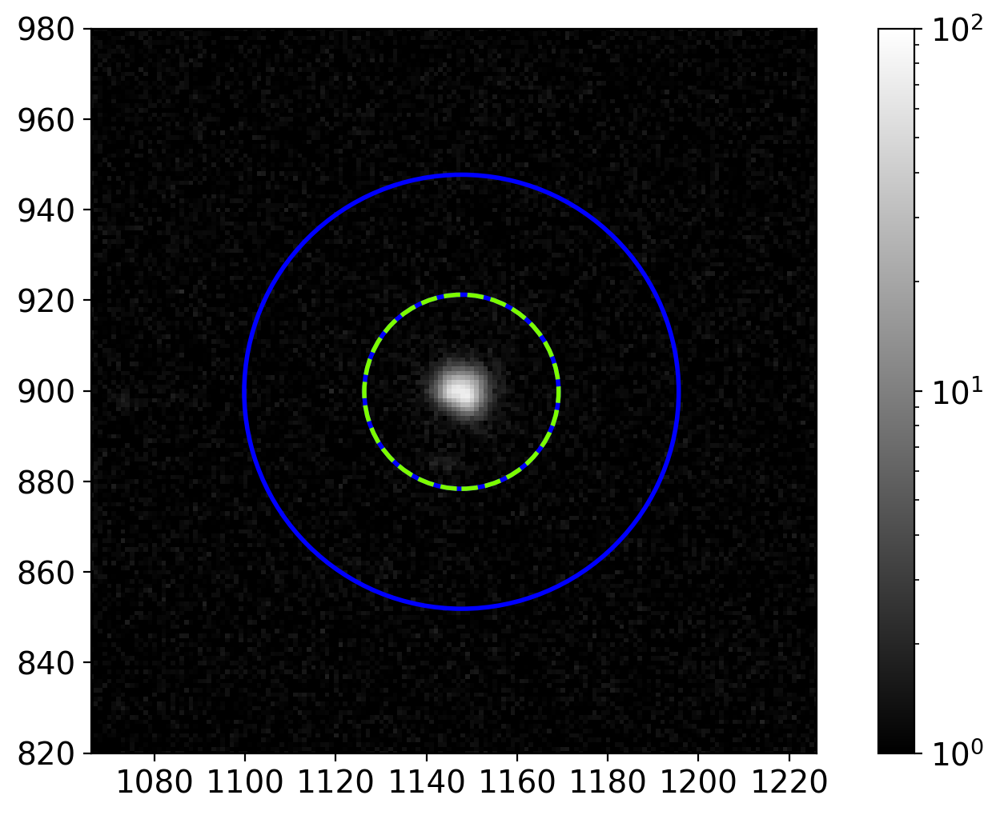

In [21]:
plt.figure(figsize=(10,6), dpi = 200)
plt.imshow(data, cmap='gray', origin='lower', interpolation='nearest', norm = colors.LogNorm(vmin = 1, vmax = 100))
annulus_aperture.plot(color='blue', lw=2)
apertures.plot(color='lawngreen', lw=2, ls = '--')
plt.xticks(size = 14)
plt.xlim(xmin-50, xmax+50)
plt.ylim(ymin-50, ymax+50)
plt.yticks(size = 14)
plt.colorbar().ax.tick_params(labelsize=14)

#### Calculate the mean background level within the aperture at each position

In [22]:
aperstats = ApertureStats(data, annulus_aperture)
df_star_stats['Mean background count'] = aperstats.mean 
df_star_stats.head()

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count
0,173.098004,531.931694,1,26558.112565,1442.788882,1.092876
1,1069.169958,1336.527017,2,26200.808300,1442.788882,1.074936
2,1881.153256,195.888023,3,9263.658349,1442.788882,1.015359
3,142.818923,1678.918702,4,6911.773930,1442.788882,1.034585
4,2302.354800,612.936648,5,7299.998129,1442.788882,1.006809


#### Derive the background-subtracted total number of counts

In [23]:
total_bkg = df_star_stats['Mean background count'] * df_star_stats['Area of circular aperture']

df_star_stats['Background-subtracted sum'] = df_star_stats['Sum in circular aperture'] - total_bkg
df_star_stats.head()

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum
0,173.098004,531.931694,1,26558.112565,1442.788882,1.092876,24981.323578
1,1069.169958,1336.527017,2,26200.808300,1442.788882,1.074936,24649.902984
2,1881.153256,195.888023,3,9263.658349,1442.788882,1.015359,7798.709787
3,142.818923,1678.918702,4,6911.773930,1442.788882,1.034585,5419.086697
4,2302.354800,612.936648,5,7299.998129,1442.788882,1.006809,5847.385118


## <u> Find RV Uma's co-ordinates in every image using `astroalign`</u>
I must create a table such as the one above for every FITS file. The images must all be aligned to a singular source image so that I can recognise the relevant stars in each image even though they are moving. 

The source image I will use to align the others to will be `Reduced_RV_Uma_Light_Luminance_16_secs_001.fits` from the `uma_luminance_2022_03_20_collection`, since it's the earliest one. That is the image I just got the table for, so I don't need to generate another. I will rename it though so I remember what it is:

In [24]:
source_stats = df_star_stats
source_stats

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum
0,173.098004,531.931694,1,26558.112565,1442.788882,1.092876,24981.323578
1,1069.169958,1336.527017,2,26200.808300,1442.788882,1.074936,24649.902984
2,1881.153256,195.888023,3,9263.658349,1442.788882,1.015359,7798.709787
3,142.818923,1678.918702,4,6911.773930,1442.788882,1.034585,5419.086697
4,2302.354800,612.936648,5,7299.998129,1442.788882,1.006809,5847.385118
5,1147.705857,899.783601,6,3905.729571,1442.788882,1.008346,2450.899049
6,2294.011949,614.727375,7,7299.357521,1442.788882,1.005254,5848.988151
7,305.923499,527.846729,8,3058.745914,1442.788882,1.007337,1605.370931
8,192.074827,1657.681886,9,2761.326704,1442.788882,1.041108,1259.228173
9,526.968040,611.915749,10,2168.026862,1442.788882,1.001784,722.664560


From earlier, I narrowed down that RV Uma is somewhere around (1146, 900). The closest match appears to be id 6.

Next, I will do the same with all the other luminance files, then with the added step of aligning them to the reference. All the code and markdown in this next bit has been pretty much copy and pasted from Vicky's code.

To start with, I will do it with one file to explain the process so I actually remember wtf I was doing, then write out a loop after.

#### Create another sources table for the target image

In [25]:
target_stats = pd.DataFrame(columns=['xcenters', 'ycenters', 'id', 'Sum in circular aperture', 'Area of circular aperture', 
                                    'Mean background count', 'Background-subtracted sum'])
target_data = fits.getdata(uma_lights[-1])
daofind = DAOStarFinder(fwhm=FWHM, threshold=thresh*np.median(target_data), brightest = 15, exclude_border=True)
target_sources = daofind(target_data - np.median(target_data))  
for col in target_sources.colnames:  
    target_sources[col].info.format = '%.8g'

target_positions = np.transpose((target_sources['xcentroid'], target_sources['ycentroid']))
target_stats = pd.DataFrame(target_positions,columns=['xcenters','ycenters'])
target_stats['id'] = np.transpose(target_sources['id'])

target_apertures = CircularAperture(target_positions, r=radius)
target_CIRC_stats = ApertureStats(target_data, target_apertures)
target_stats['Sum in circular aperture'] = target_CIRC_stats.sum
target_stats['Area of circular aperture'] = target_CIRC_stats.sum_aper_area.value  

target_annulus_aperture = CircularAnnulus(target_positions, r_in=radius, r_out=radius*np.sqrt(5))
target_aperstats = ApertureStats(target_data, target_annulus_aperture)
target_stats['Mean background count'] = target_aperstats.mean 

target_total_bkg = target_stats['Mean background count'] * target_stats['Area of circular aperture']

target_stats['Background-subtracted sum'] = target_stats['Sum in circular aperture'] - target_total_bkg
target_stats.head()

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum
0,2047.255464,411.996417,1,13280.617638,1442.788882,2.751969,9310.107716
1,307.236658,328.204771,2,24865.688004,1442.788882,2.913143,20662.637475
2,984.189383,1324.475676,3,24899.458492,1442.788882,2.850761,20786.412469
3,985.463028,1325.515010,4,24901.033914,1442.788882,2.850712,20788.058390
4,1165.848616,919.688734,5,6930.609380,1442.788882,2.738479,2979.561647


#### Find the transform between the reference and target images

In [26]:
transf, (source_list, target_list) = aa.find_transform(source_stats[['xcenters', 'ycenters']],
                                                       target_stats[['xcenters', 'ycenters']])
transf

<SimilarityTransform(matrix=
    [[ 9.71317198e-01, -2.40012356e-01,  2.67023753e+02],
     [ 2.40012356e-01,  9.71317198e-01, -2.29830070e+02],
     [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]) at 0x1516a542a30>

Find the rows in the source dataframe that are in the `source_list` list - these are the stars that were matched. Using `get_indexer` to keep the rows in the same order as `source_list`

Not sure any more if the `reset_index` bit is necessary.

In [27]:
df_matched_source = source_stats.iloc[pd.Index(source_stats['xcenters']).get_indexer(source_list[:,0])]
df_matched_source.reset_index(inplace=True)
df_matched_source.head()

,index,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum
0,0,173.098004,531.931694,1,26558.112565,1442.788882,1.092876,24981.323578
1,1,1069.169958,1336.527017,2,26200.808300,1442.788882,1.074936,24649.902984
2,8,192.074827,1657.681886,9,2761.326704,1442.788882,1.041108,1259.228173
3,5,1147.705857,899.783601,6,3905.729571,1442.788882,1.008346,2450.899049
4,2,1881.153256,195.888023,3,9263.658349,1442.788882,1.015359,7798.709787


Do the same thing for the matched target dataframe.

In [28]:
df_matched_target = target_stats.iloc[pd.Index(target_stats['xcenters']).get_indexer(target_list[:,0])]
df_matched_target.reset_index(inplace=True)
df_matched_target.head()

,index,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum
0,1,307.236658,328.204771,2,24865.688004,1442.788882,2.913143,20662.637475
1,2,984.189383,1324.475676,3,24899.458492,1442.788882,2.850761,20786.412469
2,7,56.017635,1426.511566,8,5715.244597,1442.788882,2.849756,1603.648962
3,4,1165.848616,919.688734,5,6930.609380,1442.788882,2.738479,2979.561647
4,0,2047.255464,411.996417,1,13280.617638,1442.788882,2.751969,9310.107716


Add a new column to the target dataframe that has the id from the source data. calling it `id_ref`. This is the value from the `id` column. Probably a nicer way to do this but can't be arsed right now.

In [29]:
df_out = df_matched_target.join(df_matched_source['id'], rsuffix='_ref')
df_out

,index,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum,id_ref
0,1,307.236658,328.204771,2,24865.688004,1442.788882,2.913143,20662.637475,1
1,2,984.189383,1324.475676,3,24899.458492,1442.788882,2.850761,20786.412469,2
2,7,56.017635,1426.511566,8,5715.244597,1442.788882,2.849756,1603.648962,9
3,4,1165.848616,919.688734,5,6930.609380,1442.788882,2.738479,2979.561647,6
4,0,2047.255464,411.996417,1,13280.617638,1442.788882,2.751969,9310.107716,3
5,10,992.119667,685.209188,11,4702.165680,1442.788882,2.742110,745.880204,15
6,13,2241.161881,894.214114,14,4609.499490,1442.788882,2.699538,714.635573,14
7,14,2270.362135,482.859987,15,5025.236400,1442.788882,2.702931,1125.477087,13
8,8,632.061769,491.033822,9,4956.646545,1442.788882,2.774024,954.315443,10
9,9,1336.093128,458.776845,10,4822.048288,1442.788882,2.731986,880.368957,11


Using the fact that I know the id of RV Uma is id 6 in the source image:

In [30]:
source_star = source_stats.loc[source_stats['id'] == 6]
xmid_source = source_star['xcenters'][source_star.index[0]]
ymid_source = source_star['ycenters'][source_star.index[0]]

transformed_star = df_out.loc[df_out['id_ref'] == 6]
xmid_transform = transformed_star['xcenters'][transformed_star.index[0]]
ymid_transform = transformed_star['ycenters'][transformed_star.index[0]]

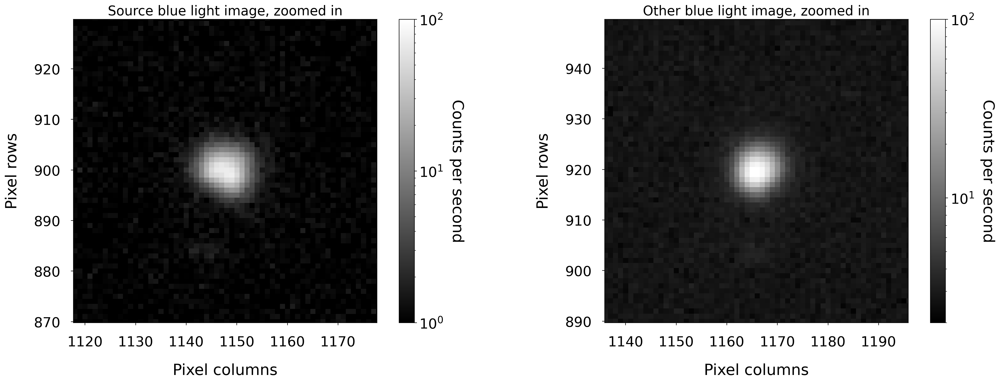

In [31]:
plt.figure(figsize=(25,8), dpi = 200)

ax = plt.subplot(1,2,1)
plt.imshow(data, cmap='gray', norm = colors.LogNorm(vmin = 1, vmax = 100))
ax.tick_params(labelsize = 20, pad = 15)
plt.title('Source blue light image, zoomed in', fontsize = 19)
plt.xlabel('Pixel columns', fontsize=22, labelpad = 20)
plt.ylabel('Pixel rows', fontsize=22, labelpad = 20)
plt.xlim(xmid_source - 30, xmid_source + 30)
plt.ylim(ymid_source - 30, ymid_source + 30)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Counts per second', fontsize = 22, rotation = 270, labelpad=30)

ax = plt.subplot(1,2,2)
plt.imshow(target_data, cmap='gray', norm = colors.LogNorm(vmin = 2, vmax = 100))
ax.tick_params(labelsize = 20, pad = 15)
plt.title('Other blue light image, zoomed in', fontsize = 19)
plt.xlabel('Pixel columns', fontsize=22, labelpad = 20)
plt.ylabel('Pixel rows', fontsize=22, labelpad = 20)
plt.xlim(xmid_transform - 30, xmid_transform + 30)
plt.ylim(ymid_transform - 30, ymid_transform + 30)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Counts per second', fontsize = 22, rotation = 270, labelpad=30)

Yay, it works :)

I can now write a massive loop that does this for every image in the collection. I have had to split it into chunks because no transformation could be found for one of the images. I am just going to leave that file out in this instance because there are so many that it doesn't really matter.


In [32]:
chunks = [[0, 161],[162,225]]

#### Create dataframe with RV Uma's row from every image

In [33]:
df_light_curve = pd.DataFrame(columns=['index', 'xcenters', 'ycenters', 'id', 'Sum in circular aperture', 
                                       'Area of circular aperture', 'Mean background count', 'Background-subtracted sum'])
for chunk in chunks:
    for light_frame in uma_lights[chunk[0]:chunk[1]]:
        #get the sources table
        target_stats = pd.DataFrame(columns=['xcenters', 'ycenters', 'id', 'Sum in circular aperture', 
                                             'Area of circular aperture', 'Mean background count', 
                                             'Background-subtracted sum'])
        target_data = fits.getdata(light_frame)
        daofind = DAOStarFinder(fwhm=FWHM, threshold=thresh*np.median(target_data), brightest = 15, exclude_border=True)
        target_sources = daofind(target_data - np.median(target_data))  
        for col in target_sources.colnames:  
            target_sources[col].info.format = '%.8g'

        target_positions = np.transpose((target_sources['xcentroid'], target_sources['ycentroid']))
        target_stats = pd.DataFrame(target_positions,columns=['xcenters','ycenters'])
        target_stats['id'] = np.transpose(target_sources['id'])

        target_apertures = CircularAperture(target_positions, r=radius)
        target_CIRC_stats = ApertureStats(target_data, target_apertures)
        target_stats['Sum in circular aperture'] = target_CIRC_stats.sum
        target_stats['Area of circular aperture'] = target_CIRC_stats.sum_aper_area.value  

        target_annulus_aperture = CircularAnnulus(target_positions, r_in=radius, r_out=radius*np.sqrt(5))
        target_aperstats = ApertureStats(target_data, target_annulus_aperture)
        target_stats['Mean background count'] = target_aperstats.mean 

        target_total_bkg = target_stats['Mean background count'] * target_stats['Area of circular aperture']

        target_stats['Background-subtracted sum'] = target_stats['Sum in circular aperture'] - target_total_bkg
        #find the transform
        transf, (source_list, target_list) = aa.find_transform(source_stats[['xcenters', 'ycenters']], 
                                                               target_stats[['xcenters', 'ycenters']])
    
        df_matched_source = source_stats.iloc[pd.Index(source_stats['xcenters']).get_indexer(source_list[:,0])]
        df_matched_source.reset_index(inplace=True)
        df_matched_target = target_stats.iloc[pd.Index(target_stats['xcenters']).get_indexer(target_list[:,0])]
        df_matched_target.reset_index(inplace=True)
    
        df_out = df_matched_target.join(df_matched_source['id'], rsuffix='_ref')

        transformed_star = df_out.loc[df_out['id_ref'] == 6]
        df_light_curve = df_light_curve.append(transformed_star)

df_light_curve.head()

,index,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum,id_ref
2,5,1147.705857,899.783601,6,3905.729571,1442.788882,1.008346,2450.899049,6.0
12,6,1148.069245,899.191777,7,3949.473187,1442.788882,1.051801,2431.946221,6.0
11,6,1148.586829,898.225082,7,4065.914954,1442.788882,1.100278,2478.446265,6.0
9,6,1148.059702,897.737782,7,4136.012346,1442.788882,1.130458,2505.000381,6.0
11,6,1152.610851,907.889641,7,4238.826023,1442.788882,1.179737,2536.714388,6.0


## <u> Determine the phase and instrumental magnitude of RV Uma in each image </u>

Change the sum of counts within an arpeture into instrumental mag follwing this method: http://www.vikdhillon.staff.shef.ac.uk/teaching/phy217/instruments/phy217_inst_photcal.html

Ths sky-subtracted signal from the target star, F, can be converted to a so-called instrumental magnitude using the formula:

$$m_{inst} = -2.5log_{10}\frac{F}{t_{exp}}$$

where $t_{exp}$ is the exposure time in seconds and F is most likely to be in counts ($\frac{F}{t_{exp}}$ is therefore number of counts per second). 

In [34]:
period = 0.46806 #period of RV Uma in days
def phase(jd, period): #how to calculate the phase using Julian dates
    ph = (jd/period) - np.floor(jd/period)
    return(ph)

In [35]:
#replace the row index numbers in the table so that they're in order
df_light_curve_list = []
for i in range (0, df_light_curve.shape[0]):
    df_light_curve_list.append(i)
df_light_curve.index = df_light_curve_list
df_light_curve

#calculate the julian date of each file
df_light_curve['Timestamp'] = None 
df_light_curve['Julian_date'] = None
for i in range(0, df_light_curve.shape[0]):
    df_light_curve['Timestamp'].loc[i] = pd.Timestamp(fits.getval(uma_lights[i], 'DATE-OBS'))
    df_light_curve['Julian_date'].loc[i] = df_light_curve['Timestamp'].loc[i].to_julian_date()

#calculate the phase from the julian date
df_light_curve['Phase'] = df_light_curve.apply(lambda x: phase(x.Julian_date, period), axis=1)

#calculate the instrumental magnitude
df_light_curve['Instrumental mag'] = -2.5 * np.log10(df_light_curve['Background-subtracted sum'])

df_light_curve.head()

,index,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum,id_ref,Timestamp,Julian_date,Phase,Instrumental mag
0,5,1147.705857,899.783601,6,3905.729571,1442.788882,1.008346,2450.899049,6.0,2022-03-20 21:32:52.956000,2459659.397835,0.754936,-8.473314
1,6,1148.069245,899.191777,7,3949.473187,1442.788882,1.051801,2431.946221,6.0,2022-03-20 21:35:15.007000,2459659.399479,0.758448,-8.464885
2,6,1148.586829,898.225082,7,4065.914954,1442.788882,1.100278,2478.446265,6.0,2022-03-20 21:37:38.055000,2459659.401135,0.761985,-8.485449
3,6,1148.059702,897.737782,7,4136.012346,1442.788882,1.130458,2505.000381,6.0,2022-03-20 21:39:57.753000,2459659.402752,0.765440,-8.497019
4,6,1152.610851,907.889641,7,4238.826023,1442.788882,1.179737,2536.714388,6.0,2022-03-20 21:42:18.961000,2459659.404386,0.768932,-8.510679


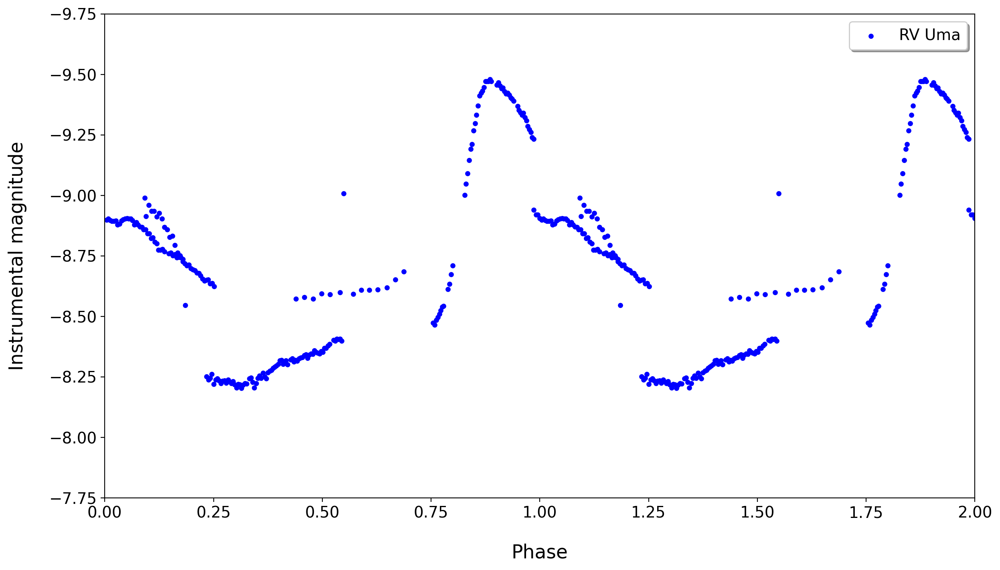

In [36]:
plt.figure(figsize=(14,8), dpi = 200)
plt.scatter(df_light_curve['Phase'], df_light_curve['Instrumental mag'], marker = 'o', color = 'blue', s = 13, label = 'RV Uma')
plt.scatter(df_light_curve['Phase'] + 1, df_light_curve['Instrumental mag'], marker = 'o', color = 'blue', s = 13)

plt.xlabel('Phase', fontsize = 17, labelpad = 20)
plt.ylabel('Instrumental magnitude', fontsize = 17, labelpad = 20)
plt.gca().invert_yaxis()
plt.ylim(-7.75, -9.75)
plt.xlim(0, 2)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.legend(shadow=True, loc='best', fontsize = 14)

## <u> Choosing standards </u>

The standards are in a seperate set of FITS files taken of another section of the sky. These are the files that were stored in the `tyc_luminance_lights` collection earlier. The standard star files were taken at two different exposure times. In the description, it says that in the short exposures there are about 3 standard stars with nice counts, and about 3 with very few counts. In the longer exposures those first ones will be saturated, but the other ones will have nice counts. To make sure all the stars are visible in the next bit, I will use one of the long exposure time files.

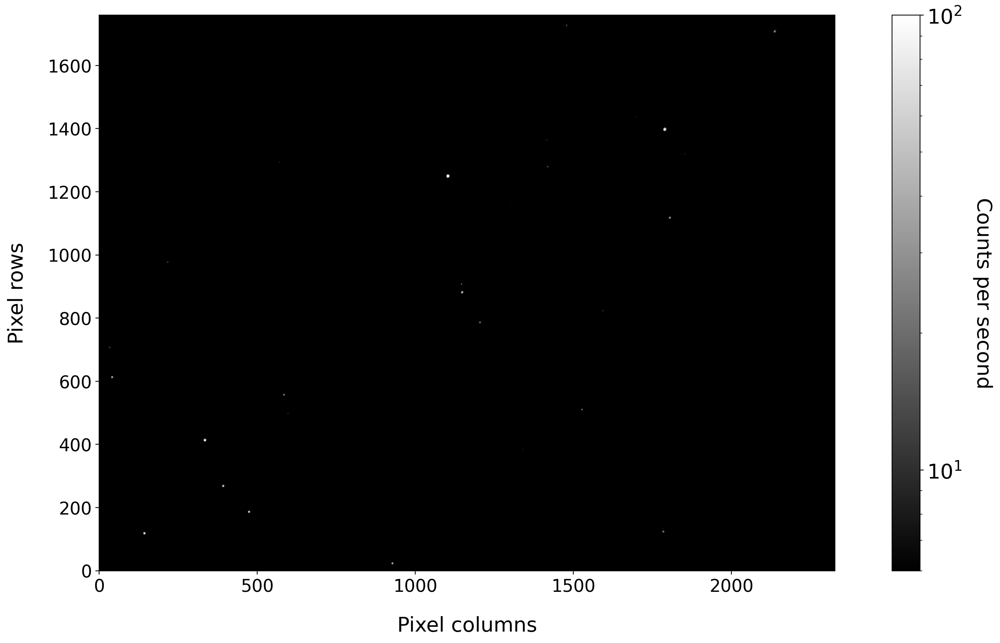

In [37]:
plt.figure(figsize=(20,10), dpi = 200)
plt.imshow(fits.getdata(tyc_lights[-1]), cmap='gray', norm = colors.LogNorm(vmin = 6, vmax = 100))
plt.xlabel('Pixel columns', fontsize=20, labelpad = 20)
plt.ylabel('Pixel rows', fontsize=20, labelpad = 20)
plt.xticks(size = 17)
plt.gca().invert_yaxis()
plt.yticks(size = 17)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Counts per second', fontsize = 20, rotation = 270, labelpad=30)

In [38]:
obj = fits.getval(tyc_lights[0], 'OBJECT')
print(f"The images are centred around the star: {obj}")

The images are centred around the star: tyc 3023-1974-1


Using this, I have identified some possible standards by comparing the image above to the sky map around TYC 3023-1974-1, found on SIMBAD: https://simbad.u-strasbg.fr/simbad/sim-id?Ident=V*%20RZ%20Cep. Telescope images can be rotated or mirrored, so I just did it by identifying the patterns in the telescope image and finding that within the image from SIMBAD.

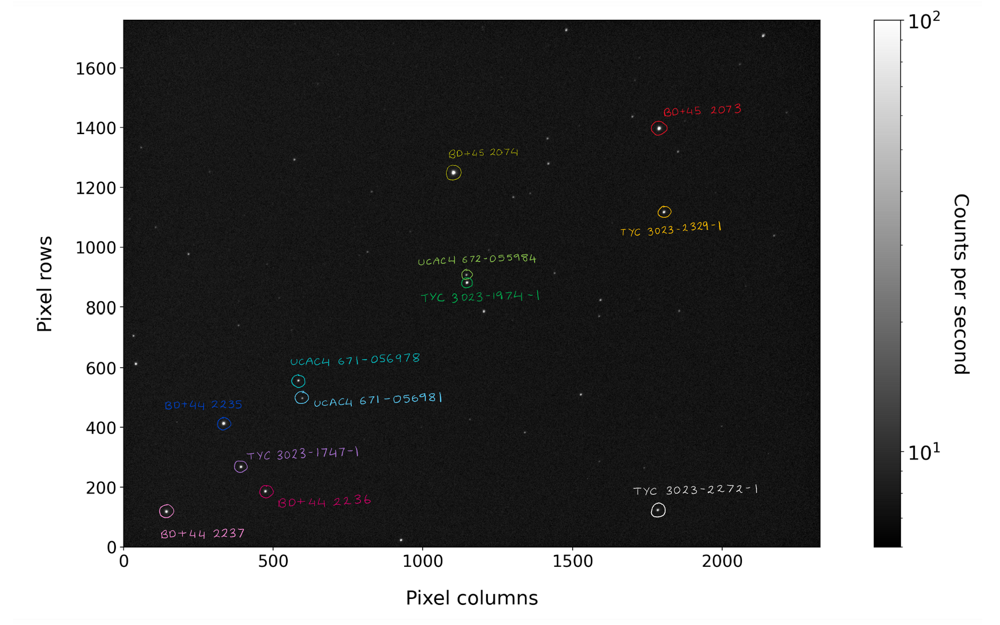

From these, I will run the names through the  `londolt_north.csv` file to see which stars are on it.

In [39]:
df_landolt = pd.read_csv("landolt_north.csv", delimiter = "|")
df_landolt.columns = df_landolt.columns.str.strip() #remove random spaces in the headers
for i in range (df_landolt.shape[0]): #remove random spaces in the standard star identifiers
    df_landolt['Identifier'][i] = df_landolt['Identifier'][i].strip()
df_landolt = df_landolt.drop(['oid', 'ra', 'dec'], axis = 1) #no clue what the oid column is
df_landolt

,Identifier
0,BD+00 3384
1,BD+44 156
2,BD+44 157
3,BD+44 1898
4,BD+44 1904
...,...
345,UCAC4 789-005539
346,UCAC4 789-005569
347,V* ER UMa
348,V* V648 Lyr


NB// My code to remove the random spaces in the standard star identfiers mostly works, but for some reason the BD stars have two spaces between sets of numbers rather than one, so make sure to include that in below.

In [40]:
df_landolt_filtered = pd.DataFrame(columns=['Identifier', 'v mag', 'b mag', 'g mag', 'r mag'])
df_landolt_filtered['v mag'], df_landolt_filtered['b mag'], df_landolt_filtered['g mag'], df_landolt_filtered['r mag'] = [np.nan, np.nan, np.nan, np.nan]
standard_identifiers = ['BD+45  2073', 'BD+45  2074', 'BD+44  2235', 'BD+44  2236',
                       'TYC 3023-1747-1', 'TYC 3023-1974-1', 'TYC 3023-2272-1', 'TYC 3023-2329-1',
                       'UCAC4 671-0566981', 'UCAC4 671-056978', 'UCAC4 672-055984' ]

for star in standard_identifiers:
    row = df_landolt.loc[(df_landolt['Identifier'] == star)]
    if row.empty != True:
        df_landolt_filtered = df_landolt_filtered.append(row)
    
for i in range(0, len(df_landolt_filtered)):
    result_table = customSimbad.query_object(df_landolt_filtered['Identifier'].iloc[i])
    df_landolt_filtered['v mag'].iloc[i] = result_table['FLUX_V'][0]
    df_landolt_filtered['b mag'].iloc[i] = result_table['FLUX_B'][0]
    df_landolt_filtered['g mag'].iloc[i] = result_table['FLUX_G'][0]
    df_landolt_filtered['r mag'].iloc[i] = result_table['FLUX_R'][0]

df_landolt_filtered

,Identifier,v mag,b mag,g mag,r mag
15,BD+45 2073,10.152,10.632,10.029308,9.869
16,BD+45 2074,9.317,10.540,8.978675,8.708
5,BD+44 2235,10.212,11.283,9.921681,9.651
6,BD+44 2236,11.313,12.118,11.100706,10.856
116,TYC 3023-1747-1,11.377,12.020,11.219140,11.019
118,TYC 3023-1974-1,11.429,12.111,11.264655,11.051
238,UCAC4 671-056978,12.433,13.154,12.214701,12.002
241,UCAC4 672-055984,13.094,13.740,13.227704,12.714


NB// Pretty sure these magnitude values are for JC filters, not ZWO which is what the BPO uses. I don't know if this will make a difference for blue, green and red? Definetly affects luminance as there literally isn't a value for the apparent mags with a luminance filter.

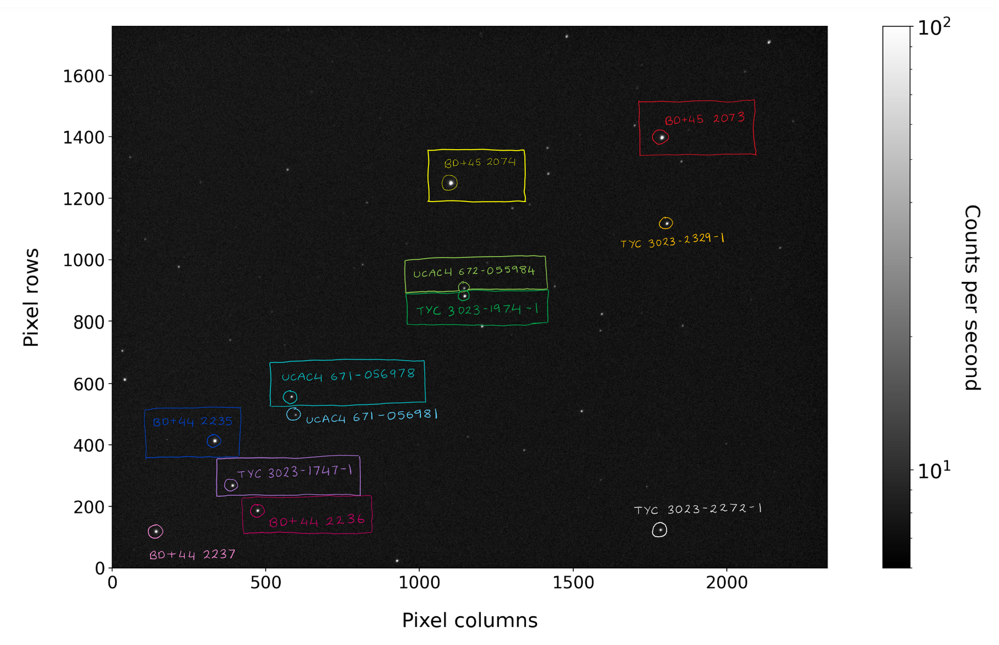

I don't need that many, so I'll pick 3-4 from these and create a new dataframe - I don't want to drop the rows from the original just incase I need to go back and switch to a different star.

Since the standard star files were taken at two different exposure times, I think I might just pick the three brightest standard stars that will all be in the short exposure files, so that I do not have to deal with both sets.

The BD+ stars are the brightest so it's best to use those. However, just be wary some are quite close to the edge and it's better not to use stars there. I think for now I will focus on the three: BD+44 2235, BD+45 2073 and BD+45 2074.

NB// How to tell if a pixel is saturated: if it is say 90% of $ \frac{4 \times 2^{12}}{t_{exposure}}$, then you can define that star as saturated and so ignore it in your analysis.

In [41]:
df_standards = df_landolt_filtered
df_standards = df_standards.drop([6, 116, 118, 238, 241])
df_standards

,Identifier,v mag,b mag,g mag,r mag
15,BD+45 2073,10.152,10.632,10.029308,9.869
16,BD+45 2074,9.317,10.540,8.978675,8.708
5,BD+44 2235,10.212,11.283,9.921681,9.651


In [42]:
#replace the row index numbers in the table so that they're in order
df_standards_idx_list = []
for i in range (0, df_standards.shape[0]):
    df_standards_idx_list.append(i)
df_standards.index = df_standards_idx_list
df_standards

,Identifier,v mag,b mag,g mag,r mag
0,BD+45 2073,10.152,10.632,10.029308,9.869
1,BD+45 2074,9.317,10.540,8.978675,8.708
2,BD+44 2235,10.212,11.283,9.921681,9.651


## <u> Find the co-ordinates of the standard stars in every image </u>

In [43]:
tyc_lights[0:14]

['Year 2 Lab\\2023_1_23\\RV Uma\\2023_04_03\\tyc_3023-1974-1\\Blue\\Reduced_Standard_2_Light_Blue_13_secs_001.fits',
 'Year 2 Lab\\2023_1_23\\RV Uma\\2023_04_03\\tyc_3023-1974-1\\Blue\\Reduced_Standard_2_Light_Blue_13_secs_002.fits',
 'Year 2 Lab\\2023_1_23\\RV Uma\\2023_04_03\\tyc_3023-1974-1\\Blue\\Reduced_Standard_2_Light_Blue_13_secs_003.fits',
 'Year 2 Lab\\2023_1_23\\RV Uma\\2023_04_03\\tyc_3023-1974-1\\Blue\\Reduced_Standard_2_Light_Blue_13_secs_004.fits',
 'Year 2 Lab\\2023_1_23\\RV Uma\\2023_04_03\\tyc_3023-1974-1\\Blue\\Reduced_Standard_2_Light_Blue_13_secs_005.fits',
 'Year 2 Lab\\2023_1_23\\RV Uma\\2023_04_03\\tyc_3023-1974-1\\Blue\\Reduced_Standard_2_Light_Blue_13_secs_006.fits',
 'Year 2 Lab\\2023_1_23\\RV Uma\\2023_04_03\\tyc_3023-1974-1\\Blue\\Reduced_Standard_2_Light_Blue_13_secs_007.fits',
 'Year 2 Lab\\2023_1_23\\RV Uma\\2023_04_03\\tyc_3023-1974-1\\Blue\\Reduced_Standard_2_Light_Blue_13_secs_008.fits',
 'Year 2 Lab\\2023_1_23\\RV Uma\\2023_04_03\\tyc_3023-1974-1\\Bl

I could not get the transformation working with these files, it said 'MaxIterError: List of matching triangles exhausted before an acceptable transformation was found' for every single one. Therefore I have had to change my method, shown below:

#### Create a chunky dataframe that holds the source table for every image

In [44]:
df_big_boi = pd.DataFrame(columns=['xcenters', 'ycenters', 'id', 'Sum in circular aperture', 'Area of circular aperture', 'Mean background count', 'Background-subtracted sum'])
for light_frame in tyc_lights[0:14]:
    #get the sources table
    target_stats = pd.DataFrame(columns=['xcenters', 'ycenters', 'id', 'Sum in circular aperture', 'Area of circular aperture', 'Mean background count', 'Background-subtracted sum'])
    target_data = fits.getdata(light_frame)
    daofind = DAOStarFinder(fwhm=FWHM, threshold=thresh*np.median(target_data), brightest = 10, exclude_border=True)
    target_sources = daofind(target_data - np.median(target_data))  
    for col in target_sources.colnames:  
        target_sources[col].info.format = '%.8g'

    target_positions = np.transpose((target_sources['xcentroid'], target_sources['ycentroid']))
    target_stats = pd.DataFrame(target_positions,columns=['xcenters','ycenters'])
    target_stats['id'] = np.transpose(target_sources['id'])

    target_apertures = CircularAperture(target_positions, r=radius)
    target_CIRC_stats = ApertureStats(target_data, target_apertures)
    target_stats['Sum in circular aperture'] = target_CIRC_stats.sum
    target_stats['Area of circular aperture'] = target_CIRC_stats.sum_aper_area.value  

    target_annulus_aperture = CircularAnnulus(target_positions, r_in=radius, r_out=radius*np.sqrt(5))
    target_aperstats = ApertureStats(target_data, target_annulus_aperture)
    target_stats['Mean background count'] = target_aperstats.mean 

    target_total_bkg = target_stats['Mean background count'] * target_stats['Area of circular aperture']

    target_stats['Background-subtracted sum'] = target_stats['Sum in circular aperture'] - target_total_bkg
    df_big_boi = df_big_boi.append(target_stats)
df_big_boi

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum
0,1095.829966,1288.382531,1,15150.630042,1442.788882,5.090831,7805.635345
1,1781.843199,1433.948945,2,13006.422115,1442.788882,5.070415,5690.883202
2,324.861270,454.743205,3,11264.159827,1442.788882,5.222051,3729.842425
3,132.713036,160.360758,4,9823.899718,1442.788882,5.239001,2265.127438
4,382.299736,309.470719,5,9267.576330,1442.788882,5.207609,1754.096574
...,...,...,...,...,...,...,...
5,473.680411,186.094444,6,6953.759433,1442.788882,3.619341,1731.814344
6,1147.496688,881.193915,7,6741.951683,1442.788882,3.568078,1593.967893
7,927.208728,22.927120,8,6231.469137,1442.788882,3.483622,1205.338084
8,40.780686,612.648817,9,6415.265888,1442.788882,3.630182,1177.680058


Okay, so the co-ordinates of my standards for each image are all somewhere within `df_big_boi`.
Using the interactive panel below, I will find the co-ordinates of the each standard in the first and last images, then locate the stars with co-ordinates between those ranges.

In [45]:
%matplotlib notebook

Plot first with `tyc_lights[0]`, then with `tyc_lights[13]`.

<IPython.core.display.Javascript object>


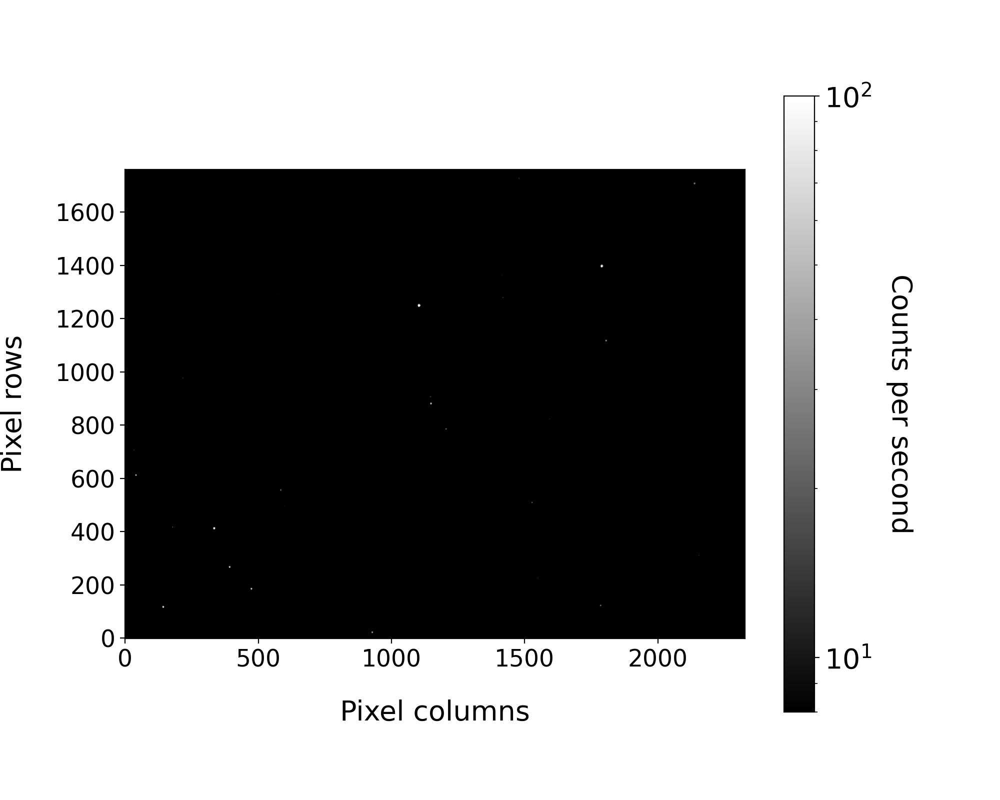

In [46]:
plt.figure(figsize=(10,8))
plt.imshow(fits.getdata(tyc_lights[13]), cmap='gray', norm = colors.LogNorm(vmin = 8, vmax = 100))
plt.xlabel('Pixel columns', fontsize=20, labelpad = 20)
plt.ylabel('Pixel rows', fontsize=20, labelpad = 20)
plt.xticks(size = 17)
plt.gca().invert_yaxis()
plt.yticks(size = 17)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20)
cbar.set_label('Counts per second', fontsize = 20, rotation = 270, labelpad=30)

Only run the next cell once you have finished with the co-ordinates as this ends the interactive terminal.

In [47]:
%matplotlib inline

Centers found:
* BD+45 2073 is somewhere around (1783, 1449) to (1788, 1410), check range x: 1700 to 1850 & y: 1300 to 1500
* BD+45 2074 is somewhere around (1096, 1227) to (1194, 1259), check range x: 950 to 1150 & y: 1150 to 1350
* BD+44 2235 is somewhere around (322, 463) to (333, 422), check range x: 300 to 350 & y: 350 to 500

In [48]:
df_standard_1 = df_big_boi.loc[(df_big_boi['xcenters'] >= 1700) & (df_big_boi['xcenters'] <= 1850) & (df_big_boi['ycenters'] >= 1300) &(df_big_boi['ycenters'] <= 1500) ]
df_standard_1

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum
1,1781.843199,1433.948945,2,13006.422115,1442.788882,5.070415,5690.883202
1,1800.644703,1413.170039,2,12832.319306,1442.788882,4.897362,5766.459972
1,1802.193032,1439.137365,2,12625.156972,1442.788882,4.609949,5973.974166
1,1788.848555,1414.416560,2,12528.324074,1442.788882,4.468268,6081.557198
1,1798.617903,1418.656199,2,12246.891708,1442.788882,4.285716,6063.508195
2,1799.153707,1396.571414,3,12286.310932,1442.788882,4.305183,6074.840971
1,1804.879147,1397.090136,2,12193.372354,1442.788882,4.211518,6117.040981
1,1794.960054,1428.206145,2,12041.269923,1442.788882,4.098060,6128.635129
1,1785.706731,1403.601820,2,11871.560458,1442.788882,3.901470,6242.563456
1,1795.733516,1440.435600,2,11823.640989,1442.788882,3.782265,6366.630883


In [49]:
df_standard_2 = df_big_boi.loc[(df_big_boi['xcenters'] >= 950) & (df_big_boi['xcenters'] <= 1150) & (df_big_boi['ycenters'] >= 1150) &(df_big_boi['ycenters'] <= 1350) ]
df_standard_2

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum
0,1095.829966,1288.382531,1,15150.630042,1442.788882,5.090831,7805.635345
0,1114.638484,1267.281157,1,15077.880631,1442.788882,4.925129,7971.958820
0,1116.346699,1293.211982,1,14818.230015,1442.788882,4.679571,8066.597114
0,1103.021450,1268.076244,1,14667.278663,1442.788882,4.491733,8186.656093
0,1112.748783,1272.245011,1,14652.583309,1442.788882,4.306897,8438.639881
0,1113.328992,1249.864954,1,14495.564716,1442.788882,4.342667,8230.013404
0,1119.117409,1250.108232,1,14467.581326,1442.788882,4.225392,8371.233092
0,1109.292910,1281.093064,1,14313.408995,1442.788882,4.119565,8369.745949
0,1100.174771,1256.264382,1,14194.272141,1442.788882,3.937150,8513.795174
0,1110.217949,1292.937545,1,14057.087503,1442.788882,3.799471,8575.252429


In [50]:
df_standard_3 = df_big_boi.loc[(df_big_boi['xcenters'] >= 300) & (df_big_boi['xcenters'] <= 500) & (df_big_boi['ycenters'] >= 350) &(df_big_boi['ycenters'] <= 500) ]
df_standard_3

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum
2,324.861270,454.743205,3,11264.159827,1442.788882,5.222051,3729.842425
2,343.892223,433.154053,3,11040.633328,1442.788882,5.063164,3735.556168
2,345.823293,459.011543,3,10727.751534,1442.788882,4.776620,3836.097483
2,333.011975,433.503944,3,10562.221989,1442.788882,4.605339,3917.690444
2,342.888980,437.583771,3,10268.338145,1442.788882,4.431528,3874.579347
1,343.919237,414.815231,2,10283.117430,1442.788882,4.462996,3843.956292
2,349.991309,414.828101,3,10216.679843,1442.788882,4.333219,3964.760005
2,340.126455,445.736868,3,10053.675001,1442.788882,4.216091,3970.745126
2,331.325497,420.666966,3,9788.133577,1442.788882,4.033057,3969.283418
2,341.334512,457.340056,3,9637.427093,1442.788882,3.894414,4018.609160


They all have 14 rows, perfect :)

In [51]:
def standard_calc(array):
    array_list = []
    for i in range (0, array.shape[0]):
        array_list.append(i)
    array.index = array_list

    array['Timestamp'] = None 
    array['Julian_date'] = None
    for i in range(0, 14):
        array['Timestamp'].loc[i] = pd.Timestamp(fits.getval(tyc_lights[i], 'DATE-OBS'))
        array['Julian_date'].loc[i] = array['Timestamp'].loc[i].to_julian_date()

    array['Phase'] = array.apply(lambda x: phase(x.Julian_date, period), axis=1)

    array['Instrumental mag'] = -2.5 * np.log10(array['Background-subtracted sum'])

In [52]:
standard_calc(df_standard_1)
standard_calc(df_standard_2)
standard_calc(df_standard_3)

df_standard_1.head()

,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum,Timestamp,Julian_date,Phase,Instrumental mag
0,1781.843199,1433.948945,2,13006.422115,1442.788882,5.070415,5690.883202,2023-04-03 21:01:22.341000,2460038.375953,0.433434,-9.387949
1,1800.644703,1413.170039,2,12832.319306,1442.788882,4.897362,5766.459972,2023-04-03 21:14:13.926000,2460038.384883,0.452513,-9.402273
2,1802.193032,1439.137365,2,12625.156972,1442.788882,4.609949,5973.974166,2023-04-03 21:27:22,2460038.394005,0.472001,-9.440658
3,1788.848555,1414.416560,2,12528.324074,1442.788882,4.468268,6081.557198,2023-04-03 21:40:45.311000,2460038.403302,0.491865,-9.460037
4,1798.617903,1418.656199,2,12246.891708,1442.788882,4.285716,6063.508195,2023-04-03 21:54:00.146000,2460038.412502,0.511519,-9.456810


(array([-10.5 , -10.25, -10.  ,  -9.75,  -9.5 ,  -9.25,  -9.  ,  -8.75,
         -8.5 ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

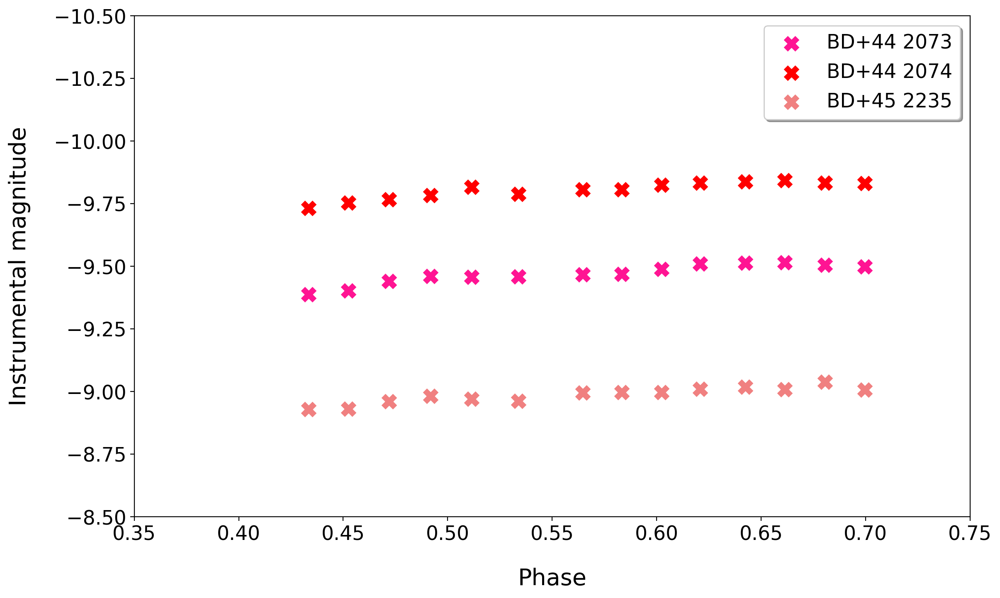

In [53]:
plt.figure(figsize=(13,8), dpi = 200)
plt.scatter(df_standard_1['Phase'], df_standard_1['Instrumental mag'], marker = 'x', color = 'deeppink', lw = 5, s = 100, label = 'BD+44 2073')
plt.scatter(df_standard_2['Phase'], df_standard_2['Instrumental mag'], marker = 'x', color = 'red', lw = 5, s = 100, label = 'BD+44 2074')
plt.scatter(df_standard_3['Phase'], df_standard_3['Instrumental mag'], marker = 'x', color = 'lightcoral', lw = 5, s = 100, label = 'BD+45 2235')

plt.legend(shadow=True, loc='best', fontsize = 17)
plt.xlabel('Phase', fontsize = 20, labelpad = 20)
plt.ylabel('Instrumental magnitude', fontsize = 20, labelpad = 20)
plt.ylim(-8.5, -10.5)
plt.xlim(0.35,0.75)
plt.xticks(fontsize = 17)
plt.yticks(fontsize = 17)

There is much less data for the standards, so I'll just have to take an average of what we do have.

I'll plot everything I have so far on one graph quickly:

(array([-10.  ,  -9.75,  -9.5 ,  -9.25,  -9.  ,  -8.75,  -8.5 ,  -8.25,
         -8.  ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

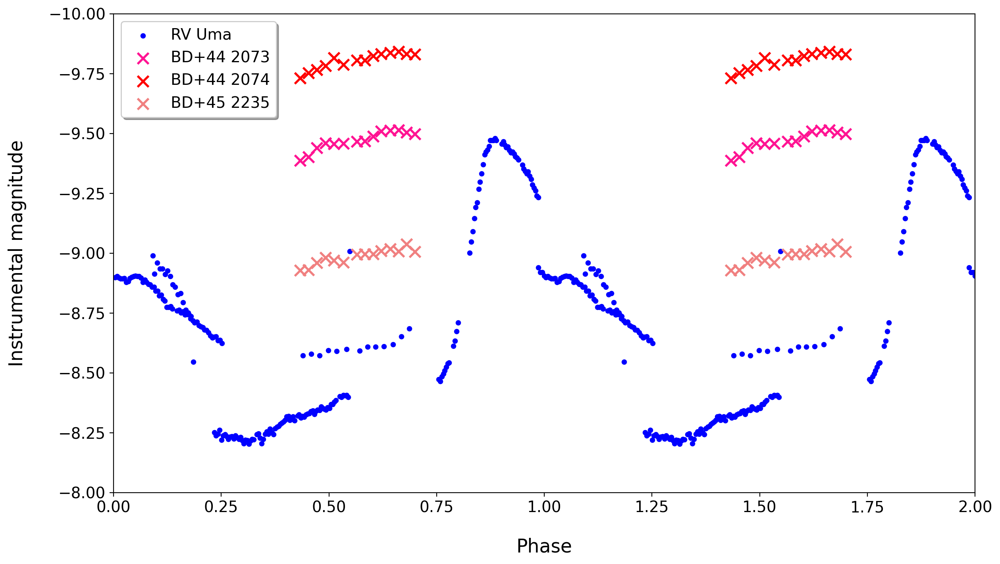

In [54]:
plt.figure(figsize=(14,8), dpi = 200)
plt.scatter(df_light_curve['Phase'], df_light_curve['Instrumental mag'], marker = 'o', color = 'blue', s = 15, 
                                                                                                    label = 'RV Uma')
plt.scatter(df_light_curve['Phase'] + 1, df_light_curve['Instrumental mag'], marker = 'o', color = 'blue', s = 15)

plt.scatter(df_standard_1['Phase'], df_standard_1['Instrumental mag'], marker = 'x', color = 'deeppink', lw = 2, s = 100, 
                                                                                                    label = 'BD+44 2073')
plt.scatter(df_standard_2['Phase'], df_standard_2['Instrumental mag'], marker = 'x', color = 'red', lw = 2, s = 100, 
                                                                                                    label = 'BD+44 2074')
plt.scatter(df_standard_3['Phase'], df_standard_3['Instrumental mag'], marker = 'x', color = 'lightcoral', lw = 2, s = 100, 
                                                                                                    label = 'BD+45 2235')
plt.scatter(df_standard_1['Phase'] + 1, df_standard_1['Instrumental mag'], marker = 'x', color = 'deeppink', lw = 2, s = 100)
plt.scatter(df_standard_2['Phase'] + 1, df_standard_2['Instrumental mag'], marker = 'x', color = 'red', lw = 2, s = 100)
plt.scatter(df_standard_3['Phase'] + 1, df_standard_3['Instrumental mag'], marker = 'x', color = 'lightcoral', lw = 2, 
                                                                                                                s = 100)
plt.legend(shadow=True, loc='best', fontsize = 14)
plt.xlabel('Phase', fontsize = 17, labelpad = 20)
plt.ylabel('Instrumental magnitude', fontsize = 17, labelpad = 20)
plt.gca().invert_yaxis()
plt.ylim(-8, -10)
plt.xlim(0, 2)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)

## <u> Calculate the apparent magnitude </u>

### Derive the zero point

The zero point is found by the equation $m_{zero point} = m_{apparent} - m_{instrumental}$ for the standard stars.

In [55]:
df_standards

,Identifier,v mag,b mag,g mag,r mag
0,BD+45 2073,10.152,10.632,10.029308,9.869
1,BD+45 2074,9.317,10.540,8.978675,8.708
2,BD+44 2235,10.212,11.283,9.921681,9.651


The average instrumental magnitides of the standard stars are:

In [56]:
df_standards['instrumental b mag'] = [np.mean(df_standard_1['Instrumental mag']), 
                                      np.mean(df_standard_2['Instrumental mag']),
                                      np.mean(df_standard_3['Instrumental mag'])]
df_standards

,Identifier,v mag,b mag,g mag,r mag,instrumental b mag
0,BD+45 2073,10.152,10.632,10.029308,9.869,-9.469343
1,BD+45 2074,9.317,10.540,8.978675,8.708,-9.803872
2,BD+44 2235,10.212,11.283,9.921681,9.651,-8.986176


In [57]:
df_standards['b zero point'] = df_standards['b mag'] - df_standards['instrumental b mag']
print(f"The average zero point is: {np.mean(df_standards['b zero point'])}")

The average zero point is: 20.23813030138058


The apparent magnitude of RV Uma is then found by the equation $m_{apparent} = m_{zero point} + m_{instrumental}$

In [58]:
df_light_curve['Apparent mag'] = np.mean(df_standards['b zero point']) + df_light_curve['Instrumental mag']
df_light_curve

,index,xcenters,ycenters,id,Sum in circular aperture,Area of circular aperture,Mean background count,Background-subtracted sum,id_ref,Timestamp,Julian_date,Phase,Instrumental mag,Apparent mag
0,5,1147.705857,899.783601,6,3905.729571,1442.788882,1.008346,2450.899049,6.0,2022-03-20 21:32:52.956000,2459659.397835,0.754936,-8.473314,11.764817
1,6,1148.069245,899.191777,7,3949.473187,1442.788882,1.051801,2431.946221,6.0,2022-03-20 21:35:15.007000,2459659.399479,0.758448,-8.464885,11.773245
2,6,1148.586829,898.225082,7,4065.914954,1442.788882,1.100278,2478.446265,6.0,2022-03-20 21:37:38.055000,2459659.401135,0.761985,-8.485449,11.752682
3,6,1148.059702,897.737782,7,4136.012346,1442.788882,1.130458,2505.000381,6.0,2022-03-20 21:39:57.753000,2459659.402752,0.765440,-8.497019,11.741111
4,6,1152.610851,907.889641,7,4238.826023,1442.788882,1.179737,2536.714388,6.0,2022-03-20 21:42:18.961000,2459659.404386,0.768932,-8.510679,11.727451
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,5,1168.744586,904.043917,6,6998.663667,1442.788882,2.924345,2779.451835,6.0,2023-04-03 22:59:22.459000,2460038.457899,0.608509,-8.609898,11.628232
220,5,1163.138076,913.065540,6,6860.276194,1442.788882,2.827048,2781.442059,6.0,2023-04-03 23:12:01.555000,2460038.466685,0.627280,-8.610675,11.627455
221,5,1153.240786,923.809337,6,6858.655685,1442.788882,2.810584,2803.575826,6.0,2023-04-03 23:26:40.312000,2460038.476855,0.649010,-8.619281,11.618850
222,5,1148.777426,918.558796,6,6892.103030,1442.788882,2.774936,2888.455669,6.0,2023-04-03 23:39:18.359000,2460038.485629,0.667754,-8.651664,11.586466


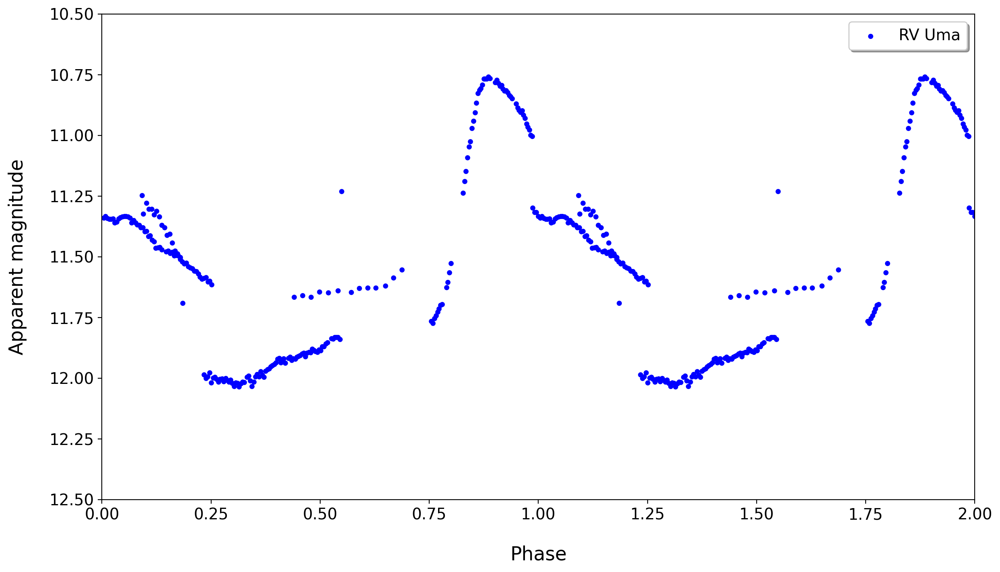

In [59]:
plt.figure(figsize=(14,8), dpi = 200)
plt.scatter(df_light_curve['Phase'], df_light_curve['Apparent mag'], marker = 'o', color = 'blue', s = 13, label = 'RV Uma')
plt.scatter(df_light_curve['Phase'] + 1, df_light_curve['Apparent mag'], marker = 'o', color = 'blue', s = 13)

plt.xlabel('Phase', fontsize = 17, labelpad = 20)
plt.ylabel('Apparent magnitude', fontsize = 17, labelpad = 20)
plt.gca().invert_yaxis()
plt.ylim(12.5, 10.5)
plt.xlim(0, 2)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.legend(shadow=True, loc='best', fontsize = 14)

In [60]:
uma_result_table = customSimbad.query_object("RV Uma")
print(f"The blue magnitude of RV Uma should be around: {uma_result_table['FLUX_B'][0]:0.2f}")

The blue magnitude of RV Uma should be around: 10.97


& on the Gaia archives, it says the mean blue magnitude is about 11.0651 ± 0.0322. So these values seem about right.

I have not taken extinction into account yet as I'm not really sure how to. It does make sense because with extinction I should expect my values to be slightly fainter that the actual values, which could be why it goes a bit too close to mag 12.